# Task 1.1 Femur and Tibia bone Segmentation

In [1]:
# import nibabel library and os to load nii file
import nibabel as nib
import os

In [2]:
# import necessary library
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
import cv2
from scipy.ndimage import label, binary_fill_holes,binary_dilation, binary_propagation, distance_transform_edt
from scipy.ndimage import generate_binary_structure, iterate_structure, zoom, binary_closing, binary_erosion

In [3]:
import imageio
from IPython.display import Image
from io import BytesIO

In [4]:
# directory name is 'data'
# file name is '3702_left_knee.nii.gz'
# join file name with data directory

data_dir = '../data/'
file_name = '3702_left_knee.nii.gz'

# function to load image
def load_nii_img(data_dir, file_name):
    data_path = data_dir
    file_path = os.path.join(data_path,file_name )
    img = nib.load(file_path)
    return img

In [5]:
#load the NIFTI image
ni_img = load_nii_img(data_dir, file_name)

In [6]:
# Access the image data, access image as numpy array
ni_img.get_fdata()

array([[[-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        ...,
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.]],

       [[-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        ...,
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.]],

       [[-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        [-1000., -1000., -1000., ..., -1000., -1000., -1000.],
        ...,
        [-10

In [7]:
# access units i.e spatial (voxel dimention weight, height and depth )and temporal(units for time between volums) units of data
ni_img.header.get_xyzt_units()

('mm', 'unknown')

it's 3D image since no time (temporal) dimension

In [8]:
# access affine information
ni_img.affine

array([[-8.69140983e-01,  0.00000000e+00,  0.00000000e+00,
         2.22500000e+02],
       [ 0.00000000e+00, -8.69140983e-01,  0.00000000e+00,
         2.22500000e+02],
       [ 0.00000000e+00,  0.00000000e+00,  2.00000000e+00,
        -9.00500000e+02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

here,
(x,y,z) ~ (-8.67mm, -8.67mm, 2mm), 
image origin is at (222.5, 222.5, -900.5 mm)

In [9]:
# access shape of data
print(ni_img.get_fdata().shape)

(512, 512, 216)


In [10]:
#get numpy array of image
data = ni_img.get_fdata()  

In [11]:
slice_idx = 260  #plot middle slice of image

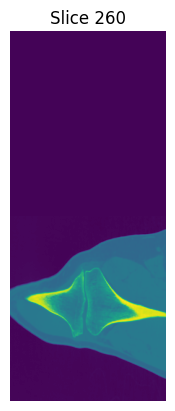

In [12]:
plt.imshow(data[:, slice_idx, :])
plt.axis('off')
plt.title(f'Slice {slice_idx}')
plt.show()

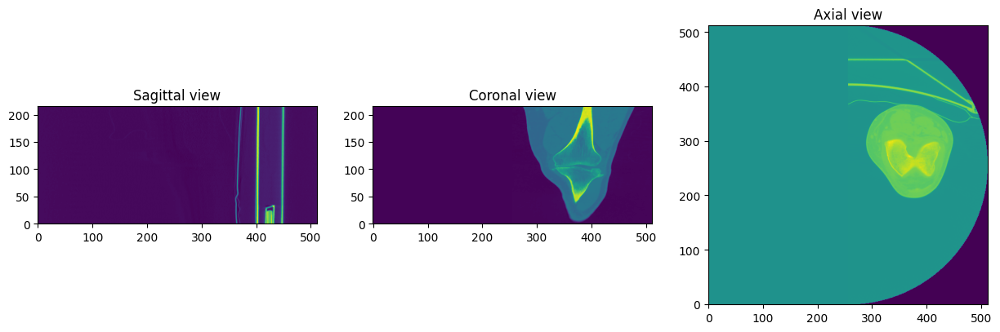

In [13]:
# Display slices from each axis
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # figure with 3 subplots

# Middle slice for each axis
axes[0].imshow(data[data.shape[0] // 2, :, :].T, origin = 'lower') # display side view
axes[0].set_title('Sagittal view')

axes[1].imshow(data[:, data.shape[1] // 2, :].T, origin = 'lower')  # display frontal view
axes[1].set_title('Coronal view')

axes[2].imshow(data[:, :, data.shape[2] // 2].T, origin = 'lower') # display above/horizontal view
axes[2].set_title('Axial view')

plt.show()

In [14]:
# visualize image in gif form
def visualize_gif(np_data):
    images = []
    for i in range(np_data.shape[0]):
        x = np_data[min(i,np_data.shape[0]-1),:,:]
        y = np_data[:,min(i,np_data.shape[1]-1),:]
        z = np_data[:,:,min(i,np_data.shape[2]-1)]

        # stack x,y,z for visualization
        img = np.concatenate((x,y,z), axis=1)

        images.append(img)
        
    # write to in-memory bytes buffer (temporary memory)
    buffer = BytesIO()
    imageio.mimsave(buffer, images, format='GIF', duration=0.01)
    buffer.seek(0)

    # display the GIF
    return Image(data=buffer.read(), format='gif')

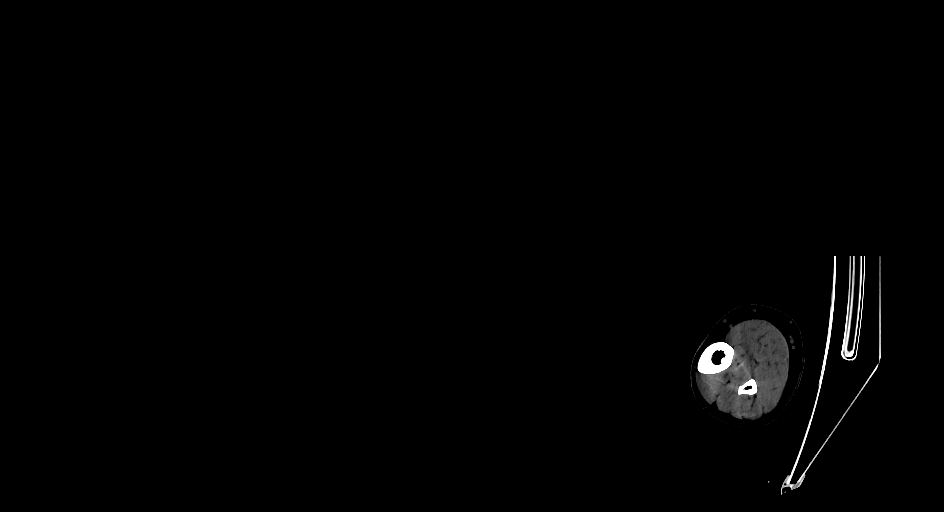

In [15]:
visualize_gif(data)

In [16]:
# Define a function to visualize a specific slice
def view_slice(y):
    plt.figure(figsize=(5, 5))
    plt.imshow(data[:, y, :].T, origin='lower')  # Display coronal view 
    plt.title(f'Coronal Slice {y}')
    plt.axis('off')
    plt.show()

# Create an interactive slider
widgets.interact(view_slice, y=(0, data.shape[1] - 1))


interactive(children=(IntSlider(value=255, description='y', max=511), Output()), _dom_classes=('widget-interac…

<function __main__.view_slice(y)>

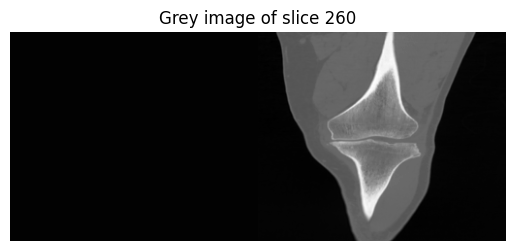

In [17]:
# grey image of coronal view of bone
title1 = 'Grey image of slice 260'
def view_slice_img(data,title):
    plt.imshow(data[:, slice_idx,:].T, origin='lower', cmap = 'grey')  #plot middle slice of image
    plt.title(title)   # image title
    plt.axis('off')    
    plt.show()  

view_slice_img(data, title1)

# Finding threshold

In [18]:
#flatten 3d data to 1d data for histogram
flatten_data = data.flatten()    

In [19]:
# max value of data
print(max(flatten_data))

1769.0


In [20]:
# min value of data
print(min(flatten_data))

-3024.0


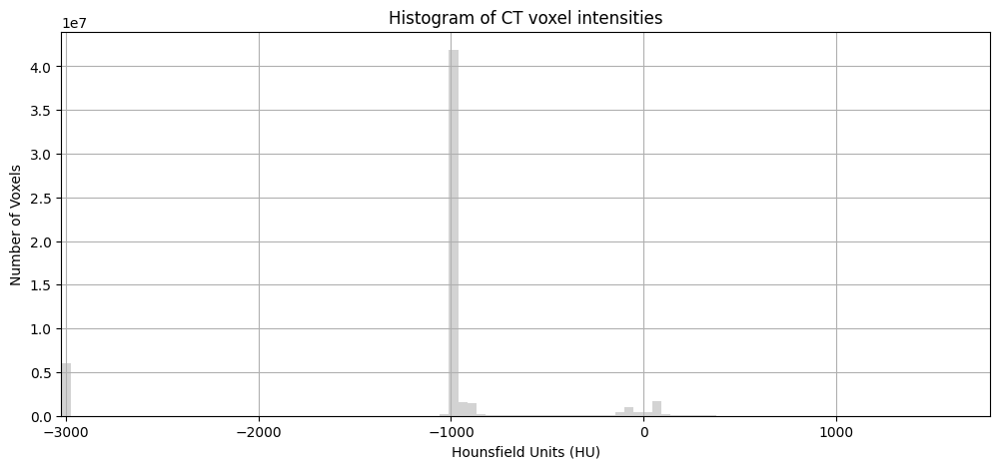

In [21]:
# plot histogram
plt.figure(figsize = (12,5))
plt.hist(flatten_data, bins = 100, color = 'lightgrey')
plt.title('Histogram of CT voxel intensities')
plt.xlabel("Hounsfield Units (HU)")
plt.ylabel("Number of Voxels")
plt.xlim(-3024, 1800)
plt.grid(True)
plt.show()

(0.0, 100000.0)

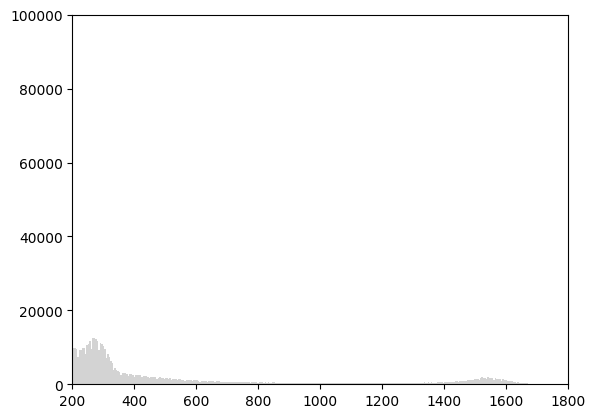

In [22]:
# focus on higher density for bones
plt.hist(data.flatten(), bins=1000, color='lightgray')
plt.xlim(200, 1800)   # only high-density regions
plt.ylim(0, 1e5)      # lower y-limit to reveal small bumps

Here intensity between 200 and 600 for Trabecular bone (soft bones) and 1400 to 1600 for cortical bone (denser bone) for trheshold try range 200 to 1600 to capture both bones


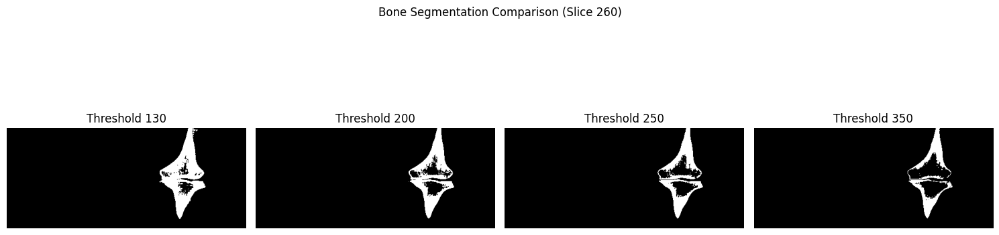

In [23]:
# let's try multiple thresholds after 200
thresholds = [130, 200, 250, 350]

plt.figure(figsize=(15, 5))

# ploting coronal view of bone in different threshold
for i, t in enumerate(thresholds):
    
    # create binary segmentation mask, keep only voxels with intensity >= threshold
    bone_mask = (data >= t).astype(np.uint8) 
    
    # create subplot in a row
    plt.subplot(1, len(thresholds), i+1)
    
    # visualize coronal slice
    plt.imshow(bone_mask[:, slice_idx, :].T, cmap='gray', origin='lower') 
    plt.title(f'Threshold {t}')
    plt.axis('off')

#title of plot
plt.suptitle(f'Bone Segmentation Comparison (Slice {slice_idx})')
plt.tight_layout()
plt.show()


Here, we can capture whole bone with threshold 130, and seperate femur bone from tibia bone with threshold 350

Identify femur mask and tibia mask with threshold 350

In [24]:
# create bone mask with threshold 350
bone_mask_350 = (data >= 350).astype(np.uint8) 

In [25]:
#printing min and max of bone_mask
print(bone_mask_350.min(),bone_mask_350.max())

0 1


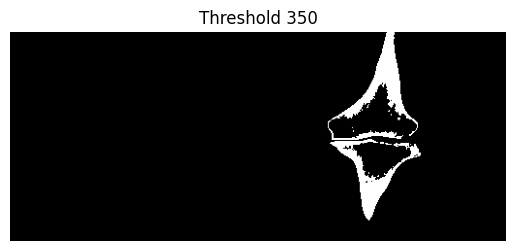

In [26]:
# visualize coronal slice at threshold 350
view_slice_img(bone_mask_350, 'Threshold 350')

In [27]:
# find label connected regions in the 3D bone mask to identify femur and tibia bone
labeled_mask, num_features = label(bone_mask_350)
print(f"Number of components detected: {num_features}")

Number of components detected: 526


In [28]:
# Count size of each component
component_sizes = np.bincount(labeled_mask.flatten())

# Get indices of two largest except index 0 since it is background
largest_labels = component_sizes[1:].argsort()[-2:] + 1
print("Tibia and Femur labels:", largest_labels)

# Create separate masks
tibia_mask = (labeled_mask == largest_labels[0]).astype(np.uint8)
femur_mask = (labeled_mask == largest_labels[1]).astype(np.uint8)

Tibia and Femur labels: [58 48]


In [29]:
# visualizing femur mask and tibia mask

def visualize_femur_tibia_mask(femur_mask, tibia_mask,title1, title2):
    # create subplots
    plt.figure(figsize=(10, 5))
    
    # for femur mask
    plt.subplot(1, 2, 1)
    plt.imshow(femur_mask[:, slice_idx, :].T, cmap='gray', origin='lower')  # at slice 260
    plt.title(title1)
    plt.axis('off')
    
    # for  tibia mask
    plt.subplot(1, 2, 2)
    plt.imshow(tibia_mask[:, slice_idx, :].T, cmap='gray', origin='lower')  # at slice 260
    plt.title(title2)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

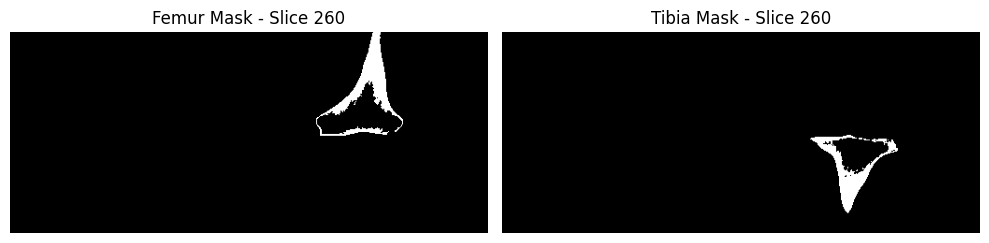

In [30]:
t1 = f"Femur Mask - Slice {slice_idx}"
t2 = f"Tibia Mask - Slice {slice_idx}"
visualize_femur_tibia_mask(femur_mask, tibia_mask, t1, t2)

In [31]:
# little expand femur and tibia mask labels to capture more area with dilation
femur_mask_dilated = binary_dilation(femur_mask, structure=np.ones((5,5,5)))
tibia_mask_dilated = binary_dilation(tibia_mask, structure=np.ones((5,5,5)))

In [32]:
# apply binary closing on femure bone as it have little opening
femur_mask_dilated = binary_closing(femur_mask_dilated)

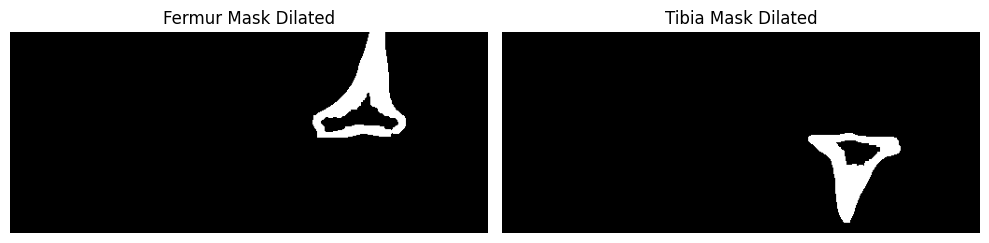

In [33]:
visualize_femur_tibia_mask(femur_mask_dilated, tibia_mask_dilated,'Fermur Mask Dilated', 'Tibia Mask Dilated')

In [34]:
# define function to fill fermur and tibia masks
def fill_3d_mask_slices(mask_3d):
    filled_mask = np.zeros_like(mask_3d, dtype=np.uint8)  # mask same as dilated mask
    for y in range(mask_3d.shape[1]):  # loop over coronal slices
        filled_mask[:, y, :] = binary_fill_holes(mask_3d[:, y, :]).astype(np.uint8)  # apply binary filling
    return filled_mask  # return filled mask

# Apply to your dilated masks
filled_femur = fill_3d_mask_slices(femur_mask_dilated)
filled_tibia = fill_3d_mask_slices(tibia_mask_dilated)


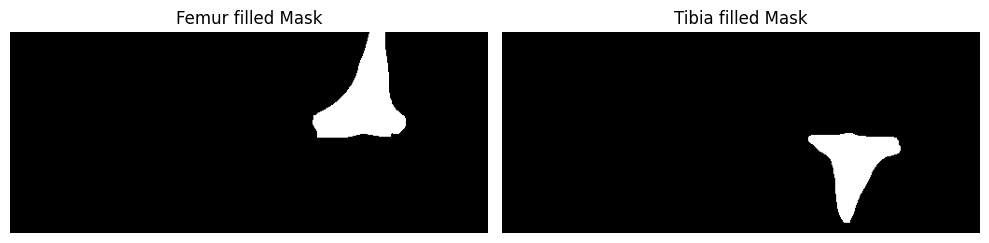

In [35]:
visualize_femur_tibia_mask(filled_femur, filled_tibia, 'Femur filled Mask' , 'Tibia filled Mask')

In [36]:
# shape of data
data.shape

(512, 512, 216)

In [37]:
# min and max value of HU (Hounsfield Units)
print(data.min(), data.max())

-3024.0 1769.0


In [38]:
# Normalize data from 0-255
norm_data = ((data - data.min()) / (data.max() - data.min()) * 255).astype(np.uint8)

In [39]:
print(norm_data.min(), norm_data.max())

0 255


In [40]:
# convert femur and tibia mask into boolean value for efficient computation
filled_femur = filled_femur.astype(bool)
filled_tibia = filled_tibia.astype(bool)

In [41]:
# Create 4D color volume with original grayscale values
color_volume = np.stack([norm_data]* 3, axis=-1) # shape (H,W, D, 3)

In [42]:
color_volume.shape

(512, 512, 216, 3)

In [43]:
# apply red and green color on femur and tibia bone
color_volume[filled_femur] = [255, 0, 0]  # Red for femur
color_volume[filled_tibia] = [0, 255, 0]  # Green for tibia

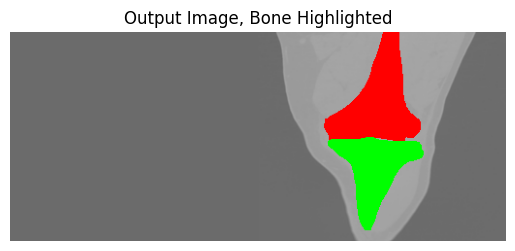

In [44]:
# Visualize output image
plt.imshow(color_volume[:, slice_idx,:,:].transpose(1,0,2), origin='lower')  #plot middle slice of image
plt.title('Output Image, Bone Highlighted')   # image title
plt.axis('off')    
plt.show()  

In [45]:
# save file in nii format
# output_folder = "D:\\NAAMII_PROJECTS\\Task1_image_processing\\RA_BONE_SEGMENTATION\\output_data"

# os.makedirs(output_folder, exist_ok=True)

# output_path = os.path.join(output_folder, "femur_tibia_segmentation_task1.1.nii.gz")
# nib.save(nib.Nifti1Image(color_volume, affine=np.eye(4)), output_path)

# Task 1.2 – Contour Expansion

### Applying contour on each fermur and tibia masks

In [46]:
# converte mask into boolean value 1= bone, 0 = background
femur_mask_bool = filled_femur.astype(bool)
tibia_mask_bool = filled_tibia.astype(bool)

In [47]:
# get voxel spacing (row_spacing, column_spacing, slice_thickness)
voxel_spacing = ni_img.header.get_zooms()
print(voxel_spacing)

(0.869141, 0.869141, 2.0)


In [48]:
# milimeter to expand
mm_expand = 2.0

# convert 2mm to voxel units (x,y,z)
x_pix = float(round(mm_expand / voxel_spacing[0],2))
y_pix = float(round(mm_expand / voxel_spacing[1],2))
z_pix = float(round(mm_expand / voxel_spacing[2],2))

print(f"Expanding by: x={x_pix}, y={y_pix}, z={z_pix} pixels")

Expanding by: x=2.3, y=2.3, z=1.0 pixels


In [49]:
# Create an ellipsoidal kernel representing a 2mm radius in all directions
xx, yy, zz = np.ogrid[
    -x_pix:x_pix+1,
    -y_pix:y_pix+1,
    -z_pix:z_pix+1
]
selem = (xx * voxel_spacing[0])**2 + (yy * voxel_spacing[1])**2 + (zz * voxel_spacing[2])**2 <= mm_expand**2

In [50]:
# Compute outer shell only
def shrink_extract_outershell(mask):
    
    # erosion shrink the mask slightly
    mask_eroded = binary_erosion(mask)
    
    # extract only outer shell of bone
    mask_contour = mask & (~ mask_eroded)
    return mask_contour

femur_contour = shrink_extract_outershell(femur_mask_bool)

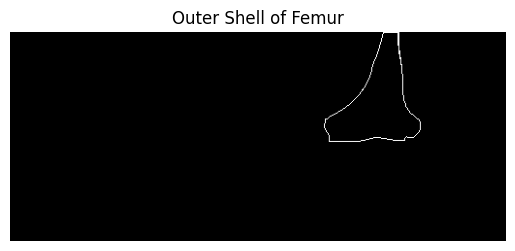

In [51]:
# visulalize outer shell of bone
view_slice_img(femur_contour, 'Outer Shell of Femur')

In [52]:
def get_only_expanded_area(contour, mask_bool, mm_expand, voxel_spacing):
    
    femur_contour_bool = contour.astype(bool)
    background = ~femur_contour_bool

    dist_mm = distance_transform_edt(background, sampling=voxel_spacing)
    expanded_contour = femur_contour_bool | (dist_mm <= mm_expand)

    only_expanded_area = expanded_contour & (~mask_bool)
    return only_expanded_area


In [53]:
femur_expanded_area = get_only_expanded_area(femur_contour, femur_mask_bool, mm_expand, voxel_spacing)

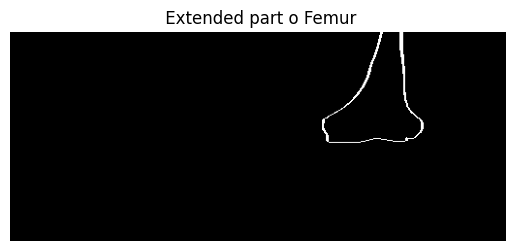

In [54]:
view_slice_img(femur_expanded_area, " Extended part o Femur")

In [55]:
# femur mask after expansion by 2mm
expanded_femur_2mm = femur_mask_bool | femur_expanded_area

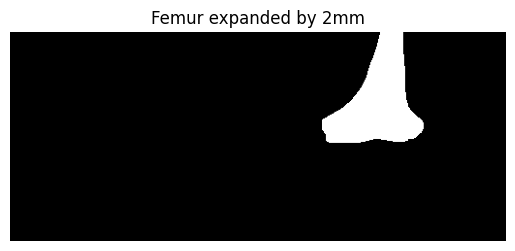

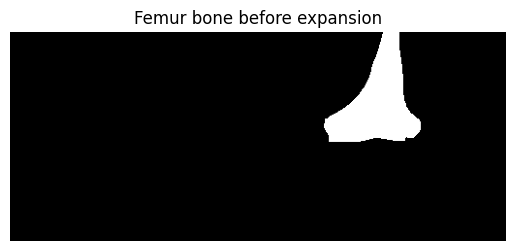

In [56]:
view_slice_img(expanded_femur_2mm, 'Femur expanded by 2mm')
view_slice_img(femur_mask_bool, 'Femur bone before expansion')

In [57]:
tibia_contour = shrink_extract_outershell(tibia_mask_bool)

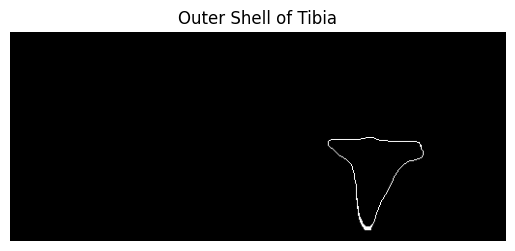

In [58]:
view_slice_img(tibia_contour, 'Outer Shell of Tibia')

In [59]:
tibia_expanded_area = get_only_expanded_area(tibia_contour, tibia_mask_bool, mm_expand, voxel_spacing)

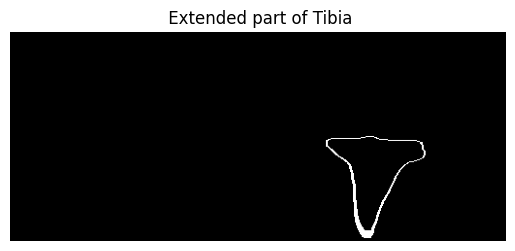

In [60]:
view_slice_img(tibia_expanded_area, " Extended part of Tibia")

In [61]:
# tibia mask after expansion by 2mm
expanded_tibia_2mm = tibia_mask_bool | tibia_expanded_area

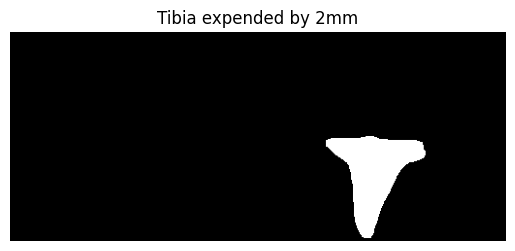

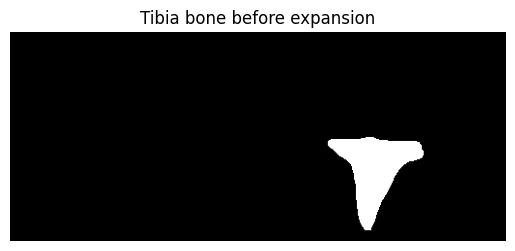

In [62]:
view_slice_img(expanded_tibia_2mm, 'Tibia expended by 2mm')
view_slice_img(tibia_mask_bool, 'Tibia bone before expansion')

In [63]:
# pick two well‑separated gray levels
color = 220 # mid-grey color

# make a copy of orginal data
gray_volume = norm_data.copy()

# paint the bones
gray_volume[expanded_femur_2mm] = color
gray_volume[expanded_tibia_2mm] = color

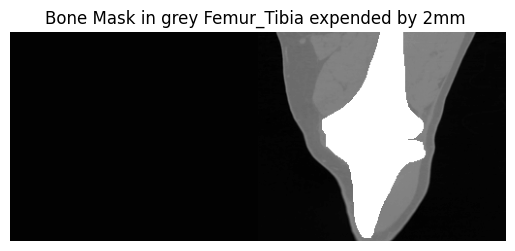

In [64]:
view_slice_img(gray_volume ,'Bone Mask in grey Femur_Tibia expended by 2mm ')

In [65]:
# save file in nii format
# output_folder = "D:\\NAAMII_PROJECTS\\Task1_image_processing\\RA_BONE_SEGMENTATION\\output_data"

# os.makedirs(output_folder, exist_ok=True)

# # save bone mask at threshold 350
# output_path = os.path.join(output_folder, "bone_mask_at_350_threshold.nii.gz")
# nib.save(nib.Nifti1Image(bone_mask_350, affine=np.eye(4)), output_path)

# #savve bone mask with 2mm expanded contour
# output_path = os.path.join(output_folder, "bone_mask_2mm_expanded.nii.gz")
# nib.save(nib.Nifti1Image(gray_volume, affine=np.eye(4)), output_path)